In [1]:
import torch
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/aarlova/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


In [2]:
from fastai.basics import *
from fastai.data.all import *
from fastai.callback import *
# from fastai.vision.all import *
torch.cuda.set_device(4)

In [3]:
data_dir = Path('YOLO_data/20x_withEmpty/data_MacNorm')
train = [(line.split("\n",1)[0]) for line in open('YOLO_data/20x_withEmpty/train_macnorm.txt')]
val = [(line.split("\n ",1)[0]) for line in open('YOLO_data/20x_withEmpty/val_macnorm.txt')]
train = [str.strip('\n') for str in train]
val = [str.strip('\n') for str in val]

test =[(line.split("\n",1)[0]) for line in open('YOLO_data/20x_withEmpty/test_macnorm.txt')]
test = [str.strip('\n') for str in test]


print(len(train), len(val), len(test))

data_splitter = FixedSplitter([train,val,test])

4087 2303 1520


In [4]:
class_map = ClassMap(['Follicle'])

parser = parsers.VOCBBoxParser(annotations_dir=data_dir,
                     images_dir=data_dir,
                     class_map=class_map)

train_records, valid_records, test_records = parser.parse(data_splitter)


  0%|          | 0/7910 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/7910 [00:00<?, ?it/s]

In [5]:
presize = 512
size = 512
train_tfms = tfms.A.Adapter([tfms.A.Resize(size, size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([tfms.A.Resize(size, size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

len(train_ds), len(valid_ds)

(4087, 2303)

In [6]:
model_type = models.ultralytics.yolov5
# backbone = model_type.backbones.small(pretrained=True)
# backbone = model_type.backbones.medium(pretrained=True)
backbone = model_type.backbones.large(pretrained=True)
#backbone = model_type.backbones.extra_large(pretrained=True)
model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes, img_size=size, device=torch.device("cuda:4"))

# model_type = models.torchvision.retinanet
# backbone = model_type.backbones.resnet50_fpn

# model_type = models.mmdet.faster_rcnn

# backbone = model_type.backbones.resnet101_fpn_2x


# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), img_size = size)

12/29/2022 09:26:26 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=1
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -     0                -1  1      7040  yolov5.models.common.Conv               [3, 64, 6, 2, 2]              
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -     1                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -     2                -1  3    156928  yolov5.models.common.C3                 [128, 128, 3]                 
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -     3                -1  1    295424  yolov5.models.common.Conv               [128, 256, 3, 2]              
12/29/2022 09:26:26 - INFO - yolov5.models.yolo -     4                -1  6   1118208  yolov5.models.common.C3   

In [7]:
model

Model(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 64, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (1): Conv(
      (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU()
    )
    (2): C3(
      (cv1): Conv(
        (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU()
      )
      (cv2): Conv(
        (conv): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU()
      )
      (cv3): Conv(
        (conv): Conv2d(128, 128, kernel

In [8]:
train_dl = model_type.train_dl(train_ds, batch_size=16, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers=2, shuffle=False)

In [9]:
# train batch example

# dl = model_type.train_dl(train_ds, batch_size=4, num_workers=2, shuffle=True)
# batch = first(dl)
# model_type.show_batch(batch, ncols=4)

In [10]:
# val batch example

# dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=2, shuffle=False)
# batch = first(dl)
# model_type.show_batch(batch, ncols=4)

In [11]:
# this is weird, but this import line needs to be here to not conflict with icevision imports - this is to be able to import FastAI callbacks
from fastai.vision.all import *

In [12]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

numeph = 30
magn = '20x'


model_name = 'yolov5' + '_' + 'large' + '_' + 'MacNorm_' + str(numeph) + '_' + magn
print(model_name)
csv_dir = '/media/14TB/aarlova_ovarian/Obj_det_retrain/'


learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics,
                                  cbs = [CSVLogger(fname=csv_dir+model_name+'.csv'), 
                                         SaveModelCallback(monitor='valid_loss', fname='/media/14TB/aarlova_ovarian/Obj_det_retrain/training_log/'+model_name)])


yolov5_large_MacNorm_30_20x


In [13]:
learn.freeze()

In [14]:
learn.fit_one_cycle(2, 1e-3)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.635778,0.435801,0.143193,01:02
1,0.561124,0.402256,0.182177,01:01


/home/aarlova/anaconda3/envs/pytorch_lym_clone/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272164809/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Better model found at epoch 0 with valid_loss value: 0.435800701379776.
Better model found at epoch 1 with valid_loss value: 0.40225574374198914.


In [15]:
learn.unfreeze()
learn.fit_one_cycle(30, 1e-4)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.503596,0.372309,0.237340,01:10
1,0.443146,0.355430,0.244263,01:09
2,0.408130,0.346743,0.261316,01:11
3,0.372192,0.336736,0.260757,01:12
4,0.353392,0.338230,0.237369,01:13
5,0.328506,0.330512,0.270530,01:14
6,0.301701,0.332868,0.253307,01:16
7,0.269456,0.349569,0.215669,01:13
8,0.243978,0.331093,0.254583,01:14
9,0.211211,0.317192,0.278349,01:14


Better model found at epoch 0 with valid_loss value: 0.37230876088142395.
Better model found at epoch 1 with valid_loss value: 0.35543036460876465.
Better model found at epoch 2 with valid_loss value: 0.34674328565597534.
Better model found at epoch 3 with valid_loss value: 0.3367362320423126.
Better model found at epoch 5 with valid_loss value: 0.3305121958255768.
Better model found at epoch 9 with valid_loss value: 0.317192405462265.


INFO     - Losses returned by model: ['loss_yolo'] | icevision.models.interpretation:plot_top_losses:218


  0%|          | 0/2303 [00:00<?, ?it/s]

  0%|          | 0/288 [00:00<?, ?it/s]

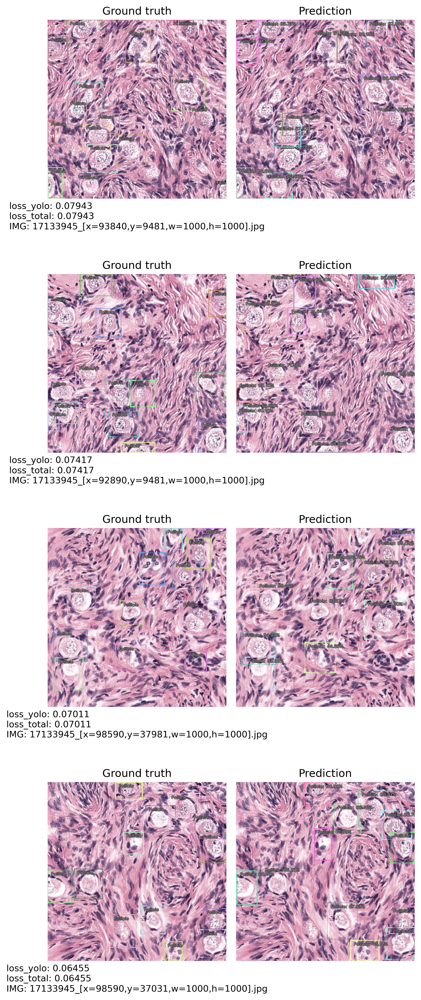

In [16]:
plt.rcParams['figure.dpi'] = 300
samples_plus_losses, preds, losses_stats = model_type.interp.plot_top_losses(model=model, dataset=valid_ds, sort_by="loss_total", n_samples=4)

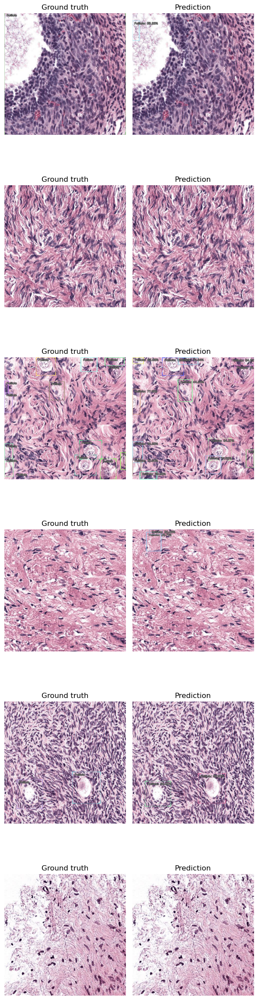

In [17]:
plt.rcParams['figure.dpi'] = 100 # for high resolution figure

model_type.show_results(model, valid_ds, detection_threshold=0.25)

In [ ]:
# infer_ds = Dataset(test_records[:100], valid_tfms)
# infer_dl = model_type.infer_dl(infer_ds, batch_size=4, shuffle=False)
# preds = model_type.predict_from_dl(model, infer_dl, keep_images=True, detection_threshold=0.25)
# plt.rcParams['figure.dpi'] = 200
# show_preds(preds=preds[0:15])